<a href="https://colab.research.google.com/github/Lirgis0/visualization_YA_8/blob/main/project_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Импорт библиотек

In [ ]:
import pandas as pd
import numpy as np
pd.options.display.max_colwidth = 150
import datetime as dt
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
register_matplotlib_converters()
import scipy.stats as st
from plotly import graph_objects as go
import math as mth
import plotly.express as px
import seaborn as sns
from statistics import median
import json
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster

### Загрузка данных и изучение общей информации

In [ ]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Предобработка данных

In [ ]:
data.duplicated().sum()

0

Явных дубликатов не обнаружено.


In [ ]:
data['name'] = data['name'].str.lower()

In [ ]:
data.duplicated().sum()

0


После приведения к нижнему регистру та же картина


In [ ]:
data.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

В целом пропусков много,но я не думаю,что мы можем что-то с этим сделать.Пока оставим так.

Добавим столбец с названиями улиц 

In [ ]:
data['address'].str.split(', ')[1][1]

'улица Дыбенко'

In [ ]:
data['street'] = data['address'].str.split(', ').apply(lambda x: x[1])

In [ ]:
data['street'].head()

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: street, dtype: object

In [ ]:
data['hours']

0                                     ежедневно, 10:00–22:00
1                                     ежедневно, 10:00–22:00
2       пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00
3                                     ежедневно, 09:00–22:00
4                                     ежедневно, 10:00–22:00
                                ...                         
8401                                  ежедневно, 09:00–02:00
8402                                  ежедневно, 08:00–22:00
8403                                ежедневно, круглосуточно
8404                                ежедневно, круглосуточно
8405                                ежедневно, круглосуточно
Name: hours, Length: 8406, dtype: object

Добавим столбец с флагом, работает ли заведение ежедневно и круглосуточно.

In [ ]:
def is_24 (x):    
    if x == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [ ]:
data['is_24/7'] = data['hours'].apply(is_24)

In [ ]:
data['is_24/7']

0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403     True
8404     True
8405     True
Name: is_24/7, Length: 8406, dtype: bool

In [ ]:
data['hours'][data['hours']=='ежедневно, круглосуточно'].count()

730

In [ ]:
data['is_24/7'][data['is_24/7']==True].count()

730

С предобработкой закончили. Теперь приступим к анализу:

### Анализ данных

#### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

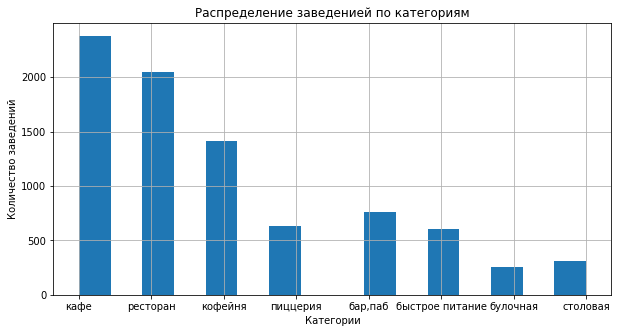

In [ ]:
data['category'].hist(figsize=(10,5), bins=16).set(
    title ='Распределение заведенией по категориям', xlabel = 'Категории', ylabel = 'Количество заведений'
)
plt.show()

In [ ]:
t=data.groupby('category').agg({'category':'count'})
t.columns=['count']
t.sort_values(by='count',ascending = False)

,count
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


In [ ]:
fig = go.Figure(data=[go.Pie(labels=t.index, values=t['count'] )])
fig.update_layout(title='Распределение заведений по категориям:')
fig.show()

Болше половины всех заведений в Москве это рестораны и кафе. Кофейни занимают третье место, а остальные категории < 10%

#### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [ ]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [ ]:
data['seats'].value_counts()

40.0     253
100.0    213
60.0     175
50.0     168
80.0     160
        ... 
600.0      1
268.0      1
61.0       1
236.0      1
33.0       1
Name: seats, Length: 229, dtype: int64

In [ ]:
t=data[data['seats'] <= 800]
t=data.groupby('category').agg({'seats':'sum'})
t.sort_values(by='seats')

,seats
category,
булочная,13229.0
столовая,16359.0
быстрое питание,34513.0
пиццерия,40350.0
"бар,паб",58281.0
кофейня,83511.0
кафе,118770.0
ресторан,154869.0


In [ ]:
fig = go.Figure(data=[go.Pie(labels=t.index, values=t['seats'] )])
fig.update_layout(title='Распределение посадочных мест в заведениях по категориям:')
fig.show()

В этом шаге я остек заведения, где посадочных мест больше 800. Думаю, все что выше это аномальные значения и конкретно в этом шаге их учитывать не нужно. Из исследования мы видим,что  более половины всех посадочных мест приходится на кафе и рестораны. Также значительные доли занимают кофейни и пабы. 

#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?


In [ ]:
data['chain'].value_counts(normalize=True)

0    0.618725
1    0.381275
Name: chain, dtype: float64

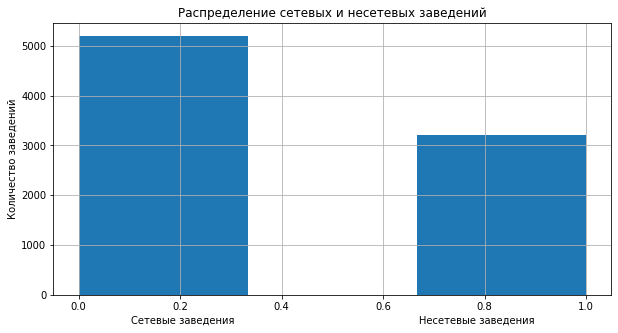

In [ ]:
data['chain'].hist(figsize=(10,5),bins=3).set(
    title ='Распределение сетевых и несетевых заведений',
    xlabel = 'Сетевые заведения                                                           Несетевые заведения',
    ylabel = 'Количество заведений'
)
plt.show()

Не сетевых заведений значительно больше,чем сетевых. 

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

<function matplotlib.pyplot.show(close=None, block=None)>

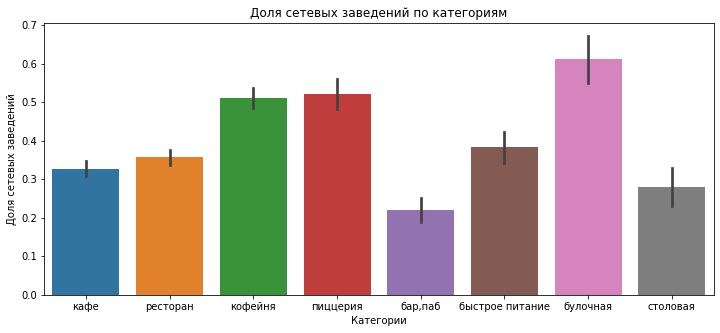

In [ ]:
plt.figure(figsize=(12,5))
sns.barplot(x='category', y='chain', data=data).set(
    title='Доля сетевых заведений по категориям',
    xlabel = 'Категории',
    ylabel = 'Доля сетевых заведений'
)
plt.show

Получается, 60% булочных являются сетевыми, примерно половина кофеен и пиццерий также, доля сетей в остальных категориях меньше половины. Меньше всего сетевых баров и пабов.

#### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.

In [ ]:
t=data[data['chain']==1].groupby(['name','category']).agg({'name':'count', 'rating': 'mean'})
t.columns=['count','rating']
t=t.sort_values(by = 'count',ascending=False).head(15)
t = t.reset_index()
t

,name,category,count,rating
0,шоколадница,кофейня,119,4.178151
1,домино'с пицца,пиццерия,76,4.169737
2,додо пицца,пиццерия,74,4.286486
3,one price coffee,кофейня,71,4.064789
4,яндекс лавка,ресторан,69,3.872464
5,cofix,кофейня,65,4.075385
6,prime,ресторан,49,4.114286
7,кофепорт,кофейня,42,4.147619
8,кулинарная лавка братьев караваевых,кафе,39,4.394872
9,теремок,ресторан,36,4.105556


In [ ]:
fig = go.Figure(data=[go.Pie(labels=t[['name','category']], values=t['count'] )])
fig.update_layout(title='Распределение внутри топ-15 сетей по количеству заведений:')
fig.show()

Самая большая сеть в этом датафрейме Шоколадница, с большим отрывом.Можно сказать,что все эти сети объединяет, то что это заведения "фастфуды", но не в привычном понимании по типу продаваемой еды, а скорее по времени обслуживания,  тоесть те где можно быстро поесть или выпить кофе. Это все относится к сетевым заведениям.

In [ ]:
data['top_15'] = data['name'].apply(lambda x: x in t['name'].unique())

In [ ]:
top_15 = data[data['top_15'] == True]

In [ ]:
top_15.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,top_15
13,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False,True
23,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False,True
24,drive café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,True,True
32,додо пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,Коровинское шоссе,False,True
34,домино'с пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,Клязьминская улица,False,True


In [ ]:
t = top_15.groupby(['category']).agg({'category':'count'})
t['fraction'] = t['category']/top_15['category'].count()*100
t.sort_values('fraction', ascending =False)
t.columns= ['count','fraction']
t.reset_index()
t.columns
t

,count,fraction
category,,
булочная,25,3.148615
быстрое питание,4,0.503778
кафе,93,11.712846
кофейня,357,44.962217
пиццерия,151,19.017632
ресторан,164,20.654912


In [ ]:
fig = go.Figure(data=[go.Pie(labels=t.index, values=t['count'] )])
fig.update_layout(title='Распределение категорий внутри топ-15 сетей')
fig.show()

#### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [ ]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [ ]:
pd.set_option('display.max_rows', 99)
t=data.groupby(['category', 'district'])['district'].count()
t

category         district                               
бар,паб          Восточный административный округ            53
                 Западный административный округ             50
                 Северный административный округ             68
                 Северо-Восточный административный округ     63
                 Северо-Западный административный округ      23
                 Центральный административный округ         364
                 Юго-Восточный административный округ        38
                 Юго-Западный административный округ         38
                 Южный административный округ                68
булочная         Восточный административный округ            25
                 Западный административный округ             37
                 Северный административный округ             39
                 Северо-Восточный административный округ     28
                 Северо-Западный административный округ      12
                 Центральный административный о

Кажется, что изображать на графике,чтото подобное бует совсем нечитаемо.

Выведу круговой график заведений по районам:

In [ ]:
t=data.groupby('district').agg({'district':'count'})
t.columns=['count']
t=t.sort_values(by = 'count',ascending=False)
t

,count
district,
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


In [ ]:
fig = go.Figure(data=[go.Pie(labels=t.index, values=t['count'] )])
fig.update_layout(title='Распределение заведений по районам:')
fig.show()

Больше четверти всех заведений находится в центральном АО, по остальным округам заведения распределены примерно равномерно, кроме северо-западного АО, там примерно в два раза меньше заведений,чем в других округах.

#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

[Text(0.5, 1.0, 'Распределение средних рейтингов по категориям заведений')]

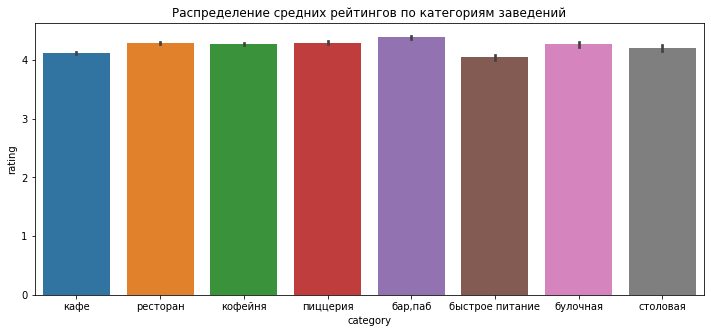

In [ ]:
plt.figure(figsize = (12,5))
sns.barplot(x='category',y='rating', data=data).set(title='Распределение средних рейтингов по категориям заведений')

Средний рейтинг у всех категорий заведений около 4. Посмотрим не по среднему, а по медиане:

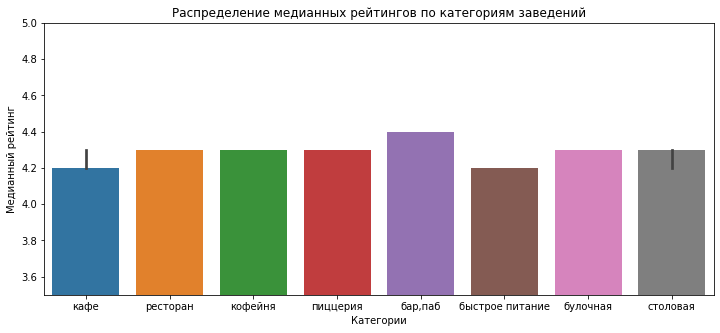

In [ ]:
plt.figure(figsize = (12,5))
sns.barplot(
    x='category',y='rating', data=data, estimator=median
).set(
    title='Распределение медианных рейтингов по категориям заведений',
    xlabel='Категории',
    ylabel='Медианный рейтинг'
)
plt.ylim(3.5,5)
plt.show()

Картина примерно такая же. Не очень показательно такое распределение.

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [ ]:
rating = data.groupby('district', as_index=False)['rating'].agg('mean')
rating

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [ ]:
state_geo = 'https://code...admin_level_geomap.geojson'

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

Похоже посетители в центральном АО чаще остаются довольными после посещения заведений, наверное дело в изысканности и качестве заведений в центре)))  Посетители в юго-восточном АО наоборот в среднем наименее удовлетворены посещением заведений.

#### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [ ]:
street_rest = (
    data.pivot_table(index='street', values='name', aggfunc='count')
    .reset_index()
)
street_rest.columns = ['street','number']
street_rest=street_rest.sort_values(by='number',ascending=False).head(15)
street_category = (
    data.pivot_table(index='street', columns='category', values='name', aggfunc='count')
    .reset_index()
)
street_rest = street_rest.merge(street_category, on='street', how='left')
street_rest

,street,number,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,184,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,122,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,108,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,107,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,95,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,88,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,77,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,76,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,70,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
9,МКАД,65,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


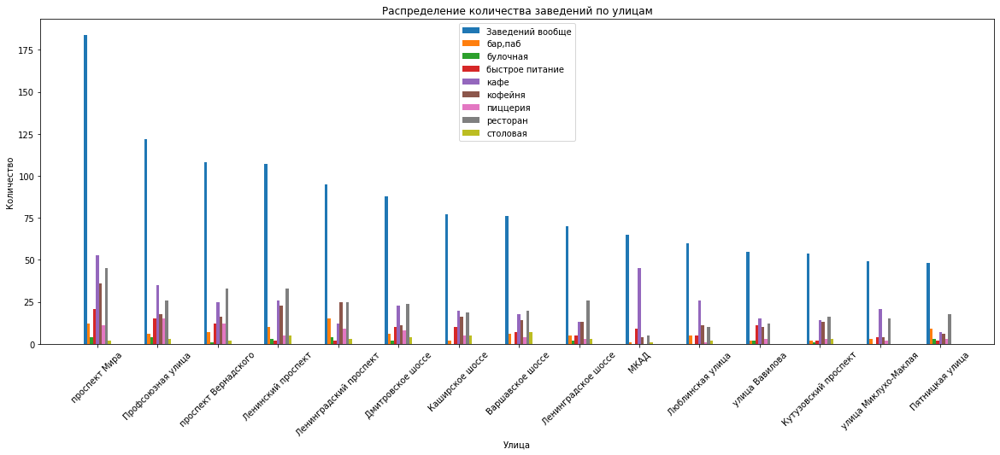

In [ ]:

plt.figure(figsize=(20,7))
width = 0.05
x = np.arange(15)



plt.bar(x-0.2,street_rest['number'], width=width,label='Заведений вообще')
plt.bar(x-0.15,street_rest['бар,паб'], width=width,label='бар,паб')
plt.bar(x-0.1,street_rest['булочная'], width=width,label='булочная')
plt.bar(x-0.05,street_rest['быстрое питание'], width=width,label='быстрое питание')
plt.bar(x-0,street_rest['кафе'], width=width,label='кафе')
plt.bar(x+0.05,street_rest['кофейня'], width=width,label='кофейня')
plt.bar(x+0.1,street_rest['пиццерия'], width=width,label='пиццерия')
plt.bar(x+0.15,street_rest['ресторан'], width=width,label='ресторан')
plt.bar(x+0.2,street_rest['столовая'], width=width,label='столовая')
plt.legend()
plt.title('Распределение количества заведений по улицам')
plt.xlabel('Улица')
plt.ylabel('Количество')
plt.xticks(rotation = 45)
plt.xticks(x, street_rest['street'])



plt.show()

Я не знаю как по другому можно визуализировать все это на одном графике, получилось плохочитаемо(

Видно, что на всех этих улицах три лидера- кофейни, рестораны и кафе. Похоже это самые популярные форматы как на топ 15 популярных улицах, так и по всей Москве. 

#### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [ ]:
t=data.groupby(['street'],as_index=False)['name'].agg('count')
t=t.sort_values(by='name').reset_index(drop=True)
t[t['name']==1]

,street,name
0,1-й Автозаводский проезд,1
1,Одинцовская улица,1
2,Октябрьский переулок,1
3,Ордынский тупик,1
4,Оренбургская улица,1
...,...,...
453,3-й Хорошёвский проезд,1
454,Бобров переулок,1
455,Богословский переулок,1
456,4-й Лесной переулок,1


Таких улиц 458. Кажется про такие заведения можно сказать,что у них меньше конкурентов. Но на соседних улицах может быть целая куча заведений, и тогда это не очень полезное исследование.

#### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [ ]:
df=data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
df

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Медианный чек по районам',
).add_to(m)
m

Самая высокий медианный чек в центральном и западном АО. Наименьший в юго-восточном АО. В центральном АО наибольшее количество заведений, при такой конкуренции чек все равно высокий,в целом это понятно, в центре находится много дорогих ресторанов. В юго-восточном АО наоборот меньше всего заведений,и похоже это в основном дешевые места. А в западном АО обычное для остальных количество заведений, но средний чек таже самый высокий.

### Вывод

Исследовав рынок общепита Москвы можно сделать вывод, что кафе, рестораны и кофейни являются самыми популярными заведениями, в этих заведениях так же наибольшее количество посадочных мест. Доля сетевых заведений  примерно 38%. Среди сетевых заведений преобладают булочные, кофейни и пиццерии. Кофейни Шоколодница - сеть с наибольшим количеством точек, за ней идут пиццерии Доминос и Додо, среди 15 самых крупных сетей представлена только одна булочная - Буханка с 25 точками, хотя доля сетевых булочных около 60%, это связано с тем, что доля булочныхна рынке Москвы всего примерно 2,5%. Больше четверти всех заведений находится в центральном АО, по остальным округам заведения распределены примерно равномерно, кроме северо-западного АО, там примерно в два раза меньше заведений,чем в других округах. Медианные и средние рейтинги по категориям если и отличаются, то незначительно, но рейтинги заведений в центре значительно выше рейтингов в остальных АО. На 15 самых "густонаселенных" заведениями улицах, как и в целом по Москве самыми популярными оказались рестораны, кафе и кофейни. В Москве 458 улиц с всего одним заведением. Медианный чек в целом по районам примерно одинаковый, кроме центрального АО , что вполне предсказуемо и западного АО, в этих двух районах он значительно выше. 

Дополнительно рассмотрим какой средний чек по категориям в западном АО, кажется это выгодное место для открытия заведения,там самый высокий средний чек наряду с центральным АО, но почти в три раза меньше заведений - меньше конкуренция.

In [ ]:
t = data[data['district'] == 'Западный административный округ']
t.groupby('category')['middle_avg_bill'].agg('mean').sort_values(ascending=False)

category
ресторан           1478.232759
бар,паб            1305.555556
пиццерия            905.071429
кафе                826.838710
булочная            723.125000
кофейня             694.444444
столовая            565.000000
быстрое питание     432.333333
Name: middle_avg_bill, dtype: float64

Возможно открытие ресторана или бара в западном АО окажется неплохой идеей.

### Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [ ]:
df = data[data['category']=='кофейня']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24/7            1413 non-null   bool   
 16  top_15             1413 

Всего в датасете 1413 кофейни, проверим не попали и сюда аномальные данные:

In [ ]:
df['seats'].describe()

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64

Опять это заведение с 1288 посадочными. Теперь при более пристальном анализе,думаю нужно удалить такие данные, сложно представить кофейню с 1288 местами.

In [ ]:
df = df[~(df['seats'] > 800)]

In [ ]:
df['seats'].describe()

count    748.000000
mean     106.811497
std      107.360198
min        0.000000
25%       40.000000
50%       80.000000
75%      144.000000
max      650.000000
Name: seats, dtype: float64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1410 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1410 non-null   object 
 1   category           1410 non-null   object 
 2   address            1410 non-null   object 
 3   district           1410 non-null   object 
 4   hours              1395 non-null   object 
 5   lat                1410 non-null   float64
 6   lng                1410 non-null   float64
 7   rating             1410 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1410 non-null   int64  
 13  seats              748 non-null    float64
 14  street             1410 non-null   object 
 15  is_24/7            1410 non-null   bool   
 16  top_15             1410 

Теперь осталось 1410 кофеен.  Посмотрим как они расположены:

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

Судя по всему кофейни расположены в центре около станций метро, в торговых центрах и на пересечении крупных улиц

Сгрупируем по районам и посмотрим ключевые значения:

In [ ]:
t = (
    df.groupby('district')
    .agg({'name':'count','rating':'mean','middle_coffee_cup':'mean','seats':'mean','is_24/7':'mean'})
    )
t.columns = ['count', 'rating', 'middle_coffee_cup', 'seats', 'is_24/7']
t.sort_values(by='count',ascending = False)

,count,rating,middle_coffee_cup,seats,is_24/7
district,,,,,
Центральный административный округ,428,4.336449,187.518519,113.146789,0.060748
Северный административный округ,193,4.291710,165.789474,117.281818,0.025907
Северо-Восточный административный округ,159,4.216981,165.333333,92.132530,0.018868
Западный административный округ,148,4.193919,189.938776,127.831461,0.060811
Южный административный округ,131,4.232824,158.488372,124.973333,0.007634
Восточный административный округ,104,4.284615,174.023810,76.022727,0.048077
Юго-Западный административный округ,96,4.283333,184.176471,86.607143,0.072917
Юго-Восточный административный округ,89,4.225843,151.088235,70.923077,0.011236
Северо-Западный административный округ,62,4.325806,165.523810,87.352941,0.032258


В цетре 428 кофеен,в остальных районах значительно меньше, в целом ситуация схожая с общим распределением всех заведений.

Попробуем найти связи между этими значениями:

In [ ]:
!pip install phik

     |████████████████████████████████| 709 kB 1.9 MB/s eta 0:00:01


In [ ]:
import phik
from phik.report import plot_correlation_matrix
from phik import report

In [ ]:
phik_overview = t.phik_matrix()

interval columns not set, guessing: ['count', 'rating', 'middle_coffee_cup', 'seats', 'is_24/7']


[Text(0.5, 1.0, 'Тепловая карта таблицы связей')]

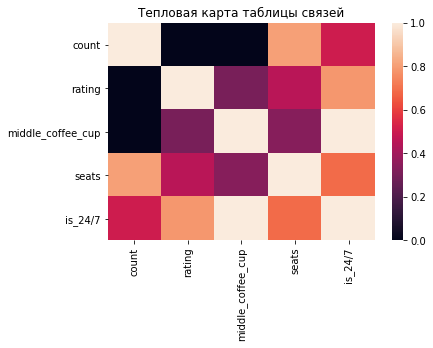

In [ ]:
sns.heatmap(phik_overview).set(title='Тепловая карта таблицы связей')

In [ ]:
phik_overview

,count,rating,middle_coffee_cup,seats,is_24/7
count,1.000000,0.000000,0.000000,0.805592,0.504275
rating,0.000000,1.000000,0.305068,0.456578,0.786663
middle_coffee_cup,0.000000,0.305068,1.000000,0.336730,1.000000
seats,0.805592,0.456578,0.336730,1.000000,0.688961
is_24/7,0.504275,0.786663,1.000000,0.688961,1.000000


Как будто есть несколько сильных связей. Рассмотрим их далее:

#### Есть ли круглосуточные кофейни?

In [ ]:
df[df['is_24/7'] == True].count()

name                 59
category             59
address              59
district             59
hours                59
lat                  59
lng                  59
rating               59
price                25
avg_bill             28
middle_avg_bill      13
middle_coffee_cup    15
chain                59
seats                37
street               59
is_24/7              59
top_15               59
dtype: int64

Всего 59 круглосутчных кофеен.

In [ ]:
phik_overview['is_24/7']

count                0.504275
rating               0.786663
middle_coffee_cup    1.000000
seats                0.688961
is_24/7              1.000000
Name: is_24/7, dtype: float64

In [ ]:
df.groupby('is_24/7').agg({'rating':'mean', 'middle_coffee_cup':'mean','seats':'mean'})

,rating,middle_coffee_cup,seats
is_24/7,,,
False,4.280459,173.553360,107.600563
True,4.206780,225.733333,91.648649


В круглосуточных кофейнях чашка кофе в среднем стоит на 50 рублей дороже. 

#### Какие у кофеен рейтинги? Как они распределяются по районам?


In [ ]:
phik_overview['rating']

count                0.000000
rating               1.000000
middle_coffee_cup    0.305068
seats                0.456578
is_24/7              0.786663
Name: rating, dtype: float64

In [ ]:
t = df.groupby('rating').agg({'is_24/7':'mean', 'middle_coffee_cup':'mean','seats':'mean'})
t

,is_24/7,middle_coffee_cup,seats
rating,,,
1.4,0.000000,NaN,NaN
2.0,0.000000,77.500000,85.000000
2.2,0.000000,NaN,NaN
2.3,0.250000,NaN,180.000000
2.6,0.000000,NaN,NaN
2.8,0.000000,NaN,60.000000
2.9,0.000000,100.000000,NaN
3.0,0.000000,150.000000,52.500000
3.1,0.142857,80.000000,117.750000


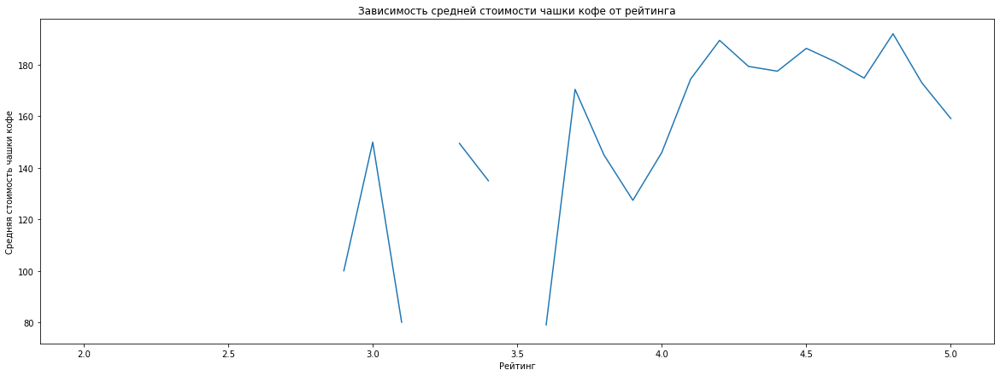

In [ ]:

plt.figure(figsize=(20,7))
plt.plot(t.index,t['middle_coffee_cup'])
plt.title('Зависимость средней стоимости чашки кофе от рейтинга')
plt.xlabel('Рейтинг')
plt.ylabel('Средняя стоимость чашки кофе')
plt.show()

Можно сказать,что мы наблюдаем зависимость, что чем выше рейтинг у кофейни, тем выше средняя цена чашки кофе.

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [ ]:
phik_overview['middle_coffee_cup']

count                0.000000
rating               0.305068
middle_coffee_cup    1.000000
seats                0.336730
is_24/7              1.000000
Name: middle_coffee_cup, dtype: float64

In [ ]:
t.sort_values(by='middle_coffee_cup',ascending = False)

,is_24/7,middle_coffee_cup,seats
rating,,,
4.8,0.034483,192.111111,91.923077
4.2,0.079208,189.539474,116.052174
4.5,0.052632,186.428571,98.886364
4.6,0.000000,181.259259,115.558824
4.3,0.042471,179.416667,107.424658
4.4,0.021930,177.556818,103.578512
4.7,0.025974,174.888889,94.209302
4.1,0.035503,174.529412,102.931034
4.9,0.027027,173.000000,44.562500


В западном АО средняя цена за чашку кофе самая высокая среди всех остальных районов, дороже даже центрального.

### Вывод по кофейне

Если хочется открыть кофейню, то я бы рекомендовал открыть ее в Западном АО, так как там похоже платежеспособная публика и не очень высокая конкуренция.При открытии можно расчитывать на чашку кофе за 180 рублей, и если в заведении будут петь "Smelly Cat", а официанткой нанять Дженнифер Энистон можно смело расчитывать на успех =)